clustering -> we dont know which grps are formed  we only know the no. of clusters


classification -> we know which grps are formed


#Clustering

Given a set of data points, grp them into a cluster so that :

point wihtin each cluster are similar to each other

points from different cluster are dissimilar

ususally points are in high dimensional space , and similarity is defined using a distance measure

Euclidean, cosine jaccard edit distance

* Cluster customers based on their purchase histories
* Cluster products based on the sets of customers who purchased them
* cluster documents based words or shingles
* Cluster DNA sequence based on edit distance

Method of clustering:

Hierarchical (Agglomerative )-.. from small grps to one class combining small grps (bottom up approach)
Initially each point in cluster by itself
Repeatedly combine two "nearest"cluster into one .

Point Assignment :
Maintain set of cluster

place point into nearest cluster





#Hierarchical Clustering

repeatedly combine two nearest cluster

1)How do you represent a cluster of more than one point?

2) How do you determine the nearness of cluster

3)When to stop combining the cluster


The distance between centroid of two clusters will be maximum

Th distance between the member point of the cluster and centroid of the cluster should be minimum

STANDARDIZATION
NORMALIZATION
SCALING

Clustering can be used for detecting outliers


#Introduction to Classification vs Clustering

In [ ]:
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt

In [ ]:
data=load_iris()
X=data.data
y=data.target
data.target_names


array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

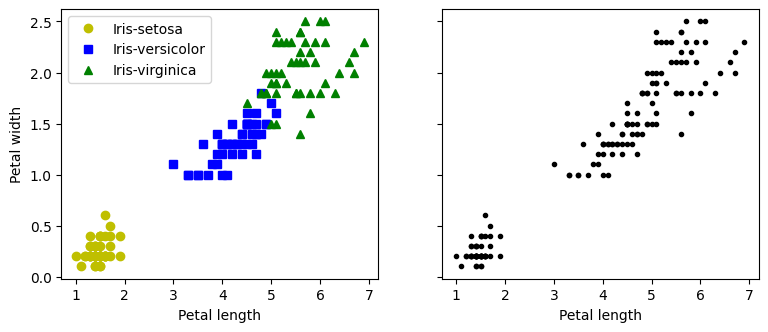

In [ ]:
plt.figure(figsize=(9,3.5))
plt.subplot(121)
plt.plot(X[y==0,2],X[y==0,3],"yo", label="Iris-setosa")
plt.plot(X[y==1,2],X[y==1,3],"bs", label="Iris-versicolor")
plt.plot(X[y==2,2],X[y==2,3],"g^", label="Iris-virginica")
plt.xlabel("Petal length")
plt.ylabel("Petal width")
plt.legend()

plt.subplot(122)
plt.scatter(X[:,2],X[:,3],c="k",marker=".")
plt.xlabel("Petal length")
plt.tick_params(labelleft=False)

plt.show()

#k means

In [ ]:
from sklearn.datasets import make_blobs
import numpy as np

In [ ]:
blob_centers=np.array([[0.2,2.3],[-1.5,2.3],[-2.8,1.8],[-2.8,2.8],[-2.8,1.3]])

blob_std=np.array([0.4,0.3,0.1,0.1,0.1])

X,y=make_blobs(n_samples=2000,centers=blob_centers,cluster_std=blob_std,random_state=7)

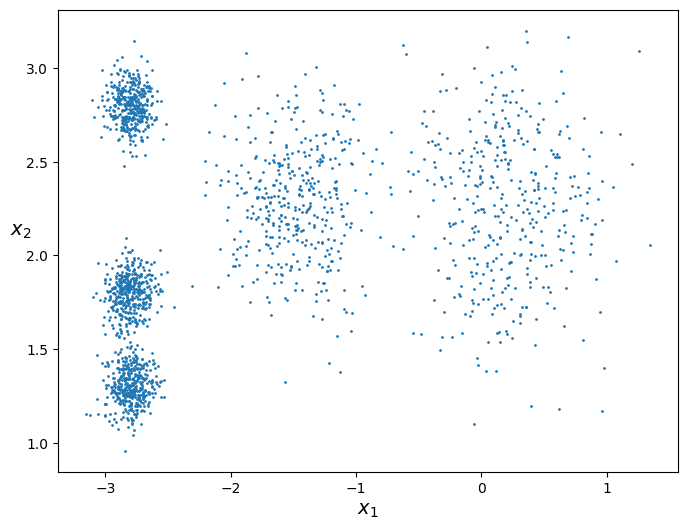

In [ ]:
def plot_clusters(X,y=None):
  plt.scatter(X[:,0],X[:,1],c=y,s=1)
  plt.xlabel("$x_1$",fontsize=14)
  plt.ylabel("$x_2$",fontsize=14,rotation=0)
plt.figure(figsize=(8,6))
plot_clusters(X)
plt.show()

In [ ]:
#Fit and Predict

from sklearn.cluster import KMeans
k=5
kmeans=KMeans(n_clusters=k,random_state=42)
y_pred=kmeans.fit_predict(X)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Each instance was assigned to one of the 5 clusters



In [ ]:
y_pred

array([4, 0, 1, ..., 2, 1, 0], dtype=int32)

In [ ]:
y_pred is kmeans.labels_

True

And the following 5 centroids(i.e) cluster center were estimated

In [ ]:
kmeans.cluster_centers_

array([[-2.80389616,  1.80117999],
       [ 0.20876306,  2.25551336],
       [-2.79290307,  2.79641063],
       [-1.46679593,  2.28585348],
       [-2.80037642,  1.30082566]])

Note that the
KMeans
instance preserves the labels of the instances it was trained on. Somewhat confusingly, in this context, the
label
of aninstance is the index of the cluster that instance gets assigned to:

In [ ]:
kmeans.labels_

array([4, 0, 1, ..., 2, 1, 0], dtype=int32)

In [ ]:
X_new=np.array([[0,2],[3,2],[-3,3],[-3,5.2]])
kmeans.predict(X_new)

array([1, 1, 2, 2], dtype=int32)

#Decision Boundaries
Let's plot the model's decision boundaries. This gives us a
Voronoi diagram
:

In [ ]:
def plot_data(X):
  plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)
  def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
      centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
      marker='o', s=30, linewidths=8,
      color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
      marker='x', s=50, linewidths=50,
      color=cross_color, zorder=11, alpha=1)
def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
show_xlabels=True, show_ylabels=True):
  mins = X.min(axis=0) - 0.1
  maxs = X.max(axis=0) + 0.1
  xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
  np.linspace(mins[1], maxs[1], resolution))
  Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
  Z = Z.reshape(xx.shape)
  plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
  cmap="Pastel2")
  plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
  linewidths=1, colors='k')
  plot_data(X)
  if show_centroids:
    plot_centroids(clusterer.cluster_centers_)
  if show_xlabels:
    plt.xlabel("$x_1$", fontsize=14)
  else:
    plt.tick_params(labelbottom=False)
  if show_ylabels:
    plt.ylabel("$x_2$", fontsize=14, rotation=0)
  else:
    plt.tick_params(labelleft=False)


NameError: name 'plot_centroids' is not defined

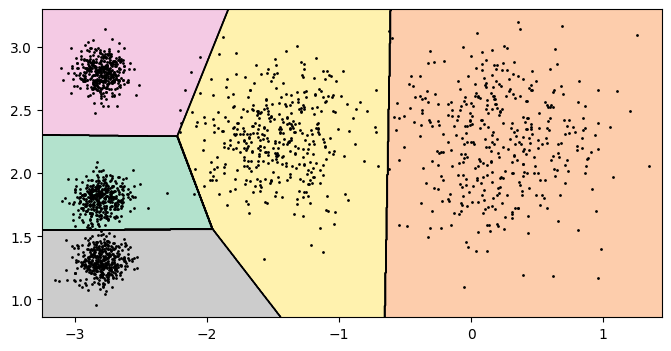

In [ ]:
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, X)
save_fig("voronoi_plot")
plt.show()

#Implementing Heirarchical Clustering

Naives implementation:

At each step , compute pairwise distance between each pair of cluster

O(N^3)

Careful implementation using a priority queue can reduce time to O(N^2logN)

Too expensive for really big data sets that dont fit in memory

#K means Algorithms

Assumes Euclidean space

Start by picking k the number of cluster

Initialize cluster by picking one point per cluster

Example : pick one point at random then k-1 other point each as far away as possible from the previous points

#Example


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


In [ ]:
dataset=pd.read_csv('Mall_Customers.csv')
dataset


In [ ]:
X=dataset.iloc[:,[3,4]].values
X

In [ ]:
y = dataset.iloc[:,3].values


#Splitting the dataset into training and testing data

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [ ]:
from sklearn.preprocessing import StandardScaler
sc_X=StandardScaler()
X_train=sc_X.fit_transform(X_train)
X_test=sc_X.transform(X_test)
sc_y=StandardScaler()
y_train=sc_y.fit_transform(y_train.reshape(-1,1))

In [ ]:
from sklearn.cluster import KMeans
wcss=[]
for i in range(1,11):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
  kmeans.fit(X)
  wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show

In [ ]:
# Fitting K-Means to the dataset
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X)

# Visualising the clusters
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = '', label = 'Centroids')
plt.title('Clusters of customers')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.legend()
plt.show()

Hierarchical Clustering := Aglomerative -> dendogram is used for visualization

In [ ]:
# Using the dendrogram to find the optimal number of clusters
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

# Fitting Hierarchical Clustering to the dataset
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='ward')
y_hc = hc.fit_predict(X)

# # Visualising the clusters
# plt.scatter(X[y_hc == 0, 0], X[y_hc == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
# plt.scatter(X[y_hc == 1, 0], X[y_hc == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
# plt.scatter(X[y_hc == 2, 0], X[y_hc == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
# plt.scatter(X[y_hc == 3, 0], X[y_hc == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
# plt.scatter(X[y_hc == 4, 0], X[y_hc == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5')
# plt.title('Clusters of customers')
# plt.xlabel('Annual Income (k$)')
# plt.ylabel('Spending Score (1-100)')
# plt.legend()
# plt.show()

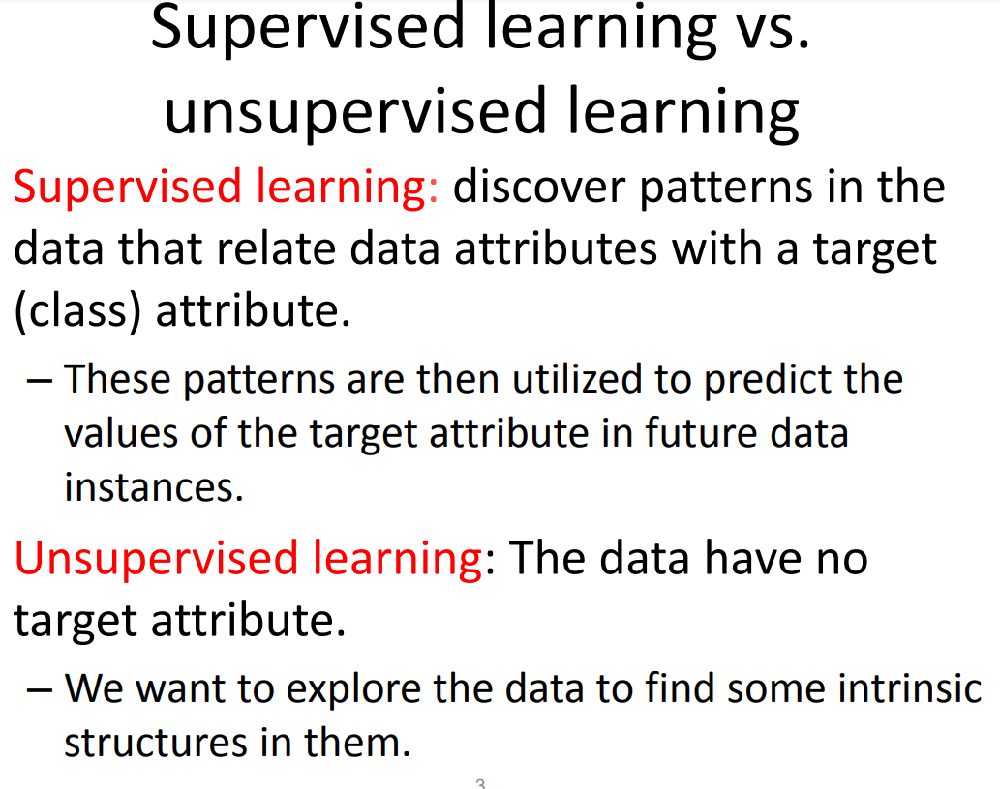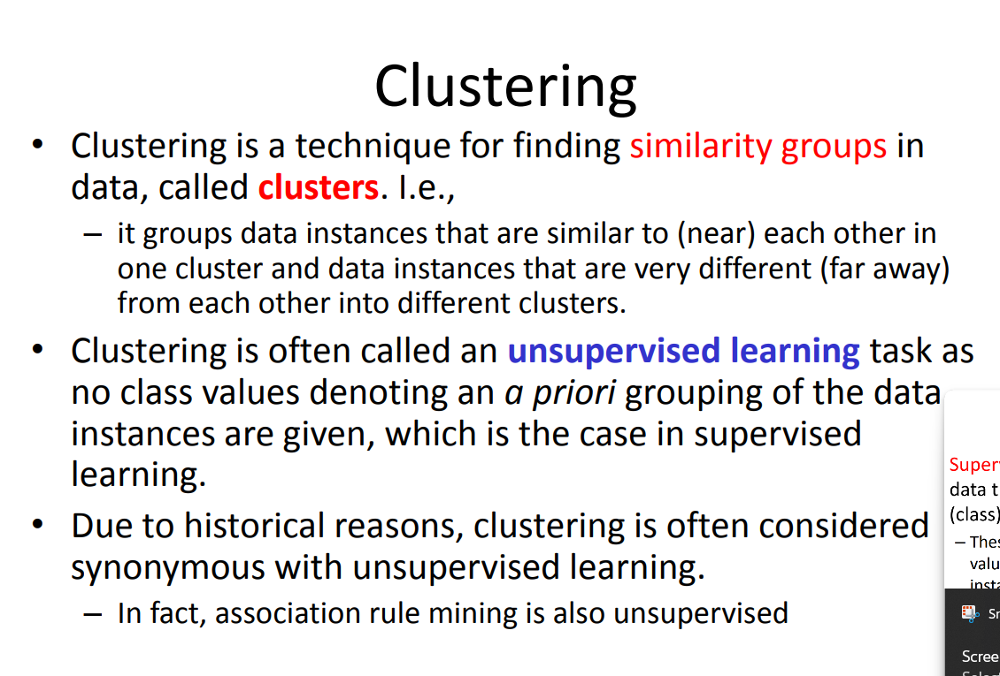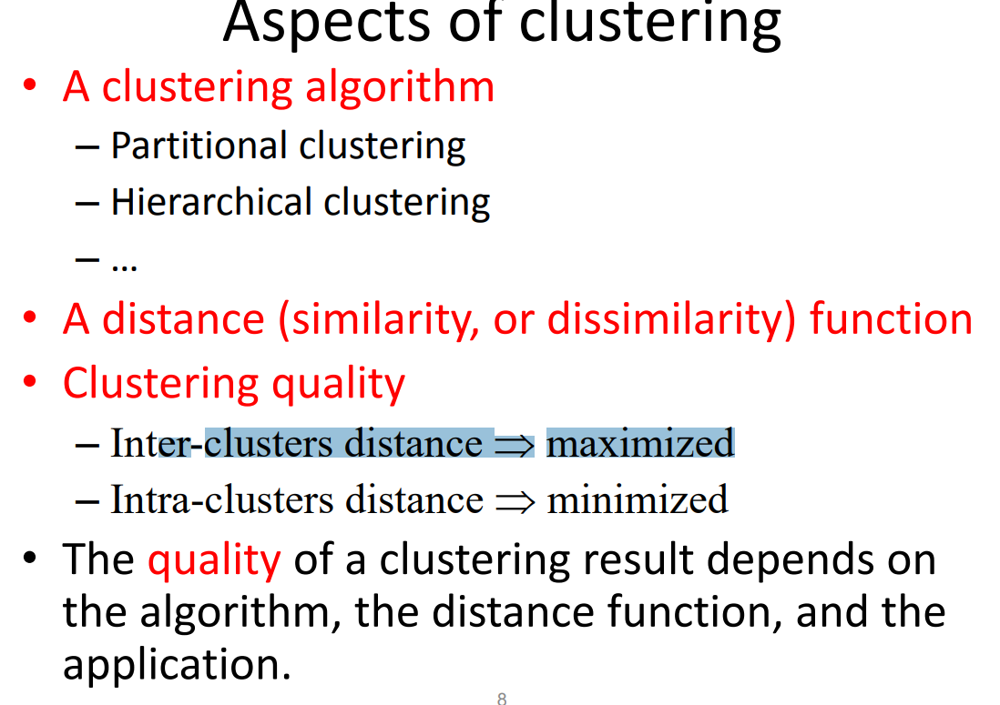

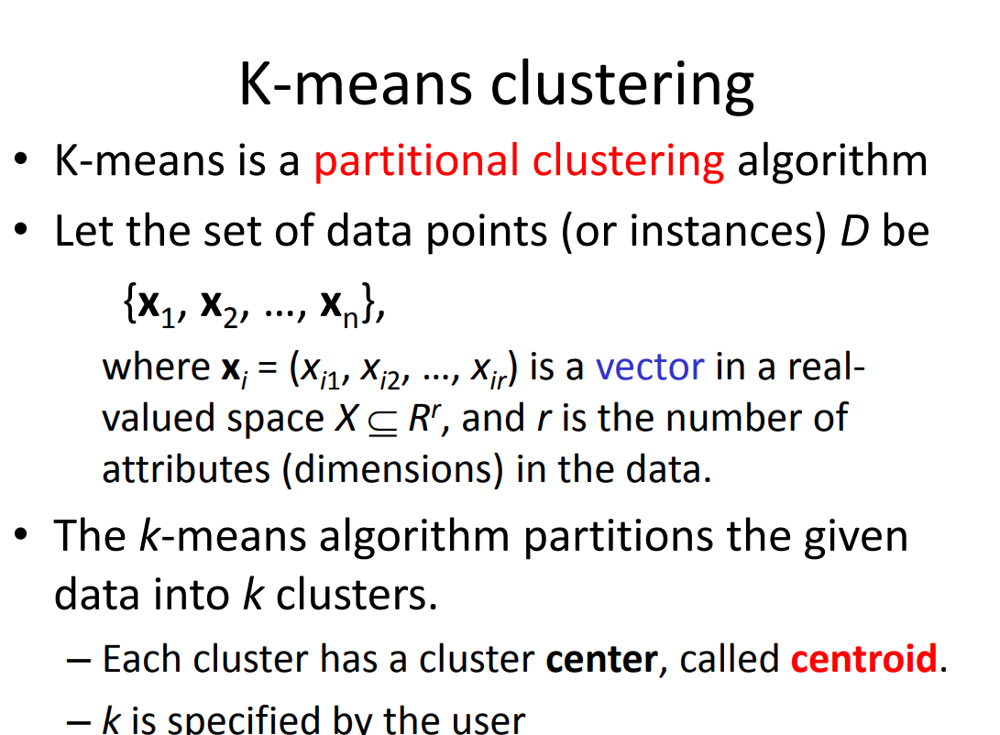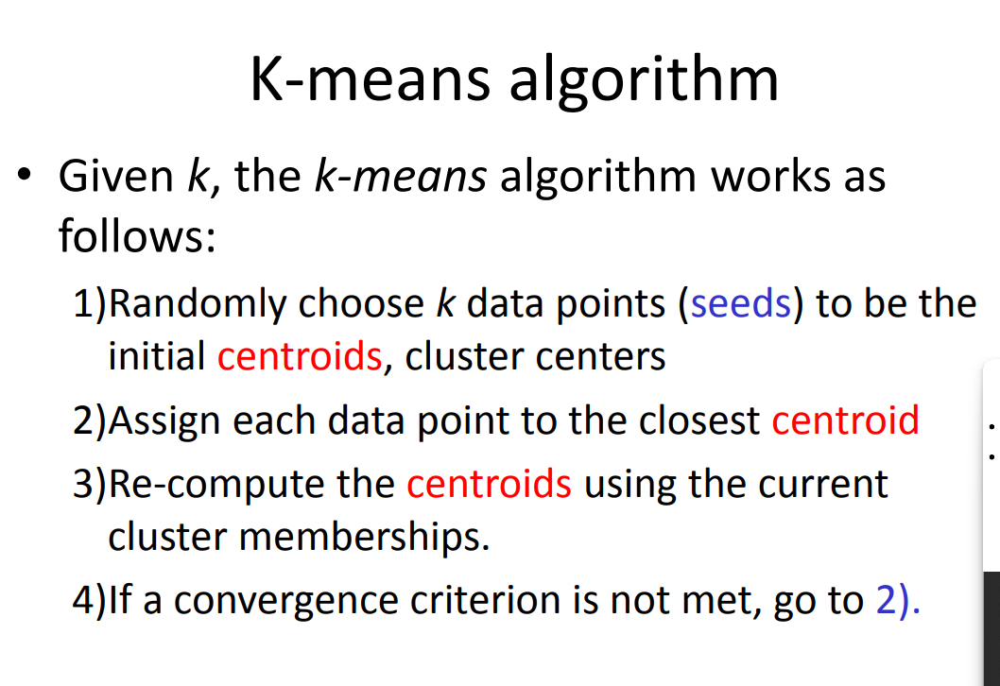
...
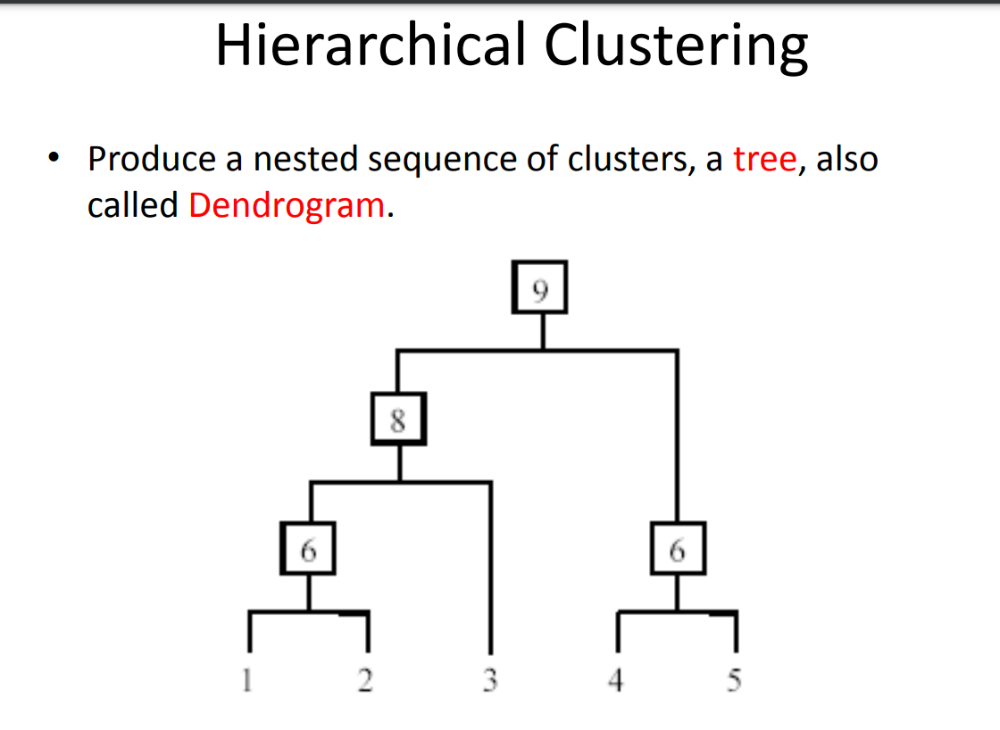

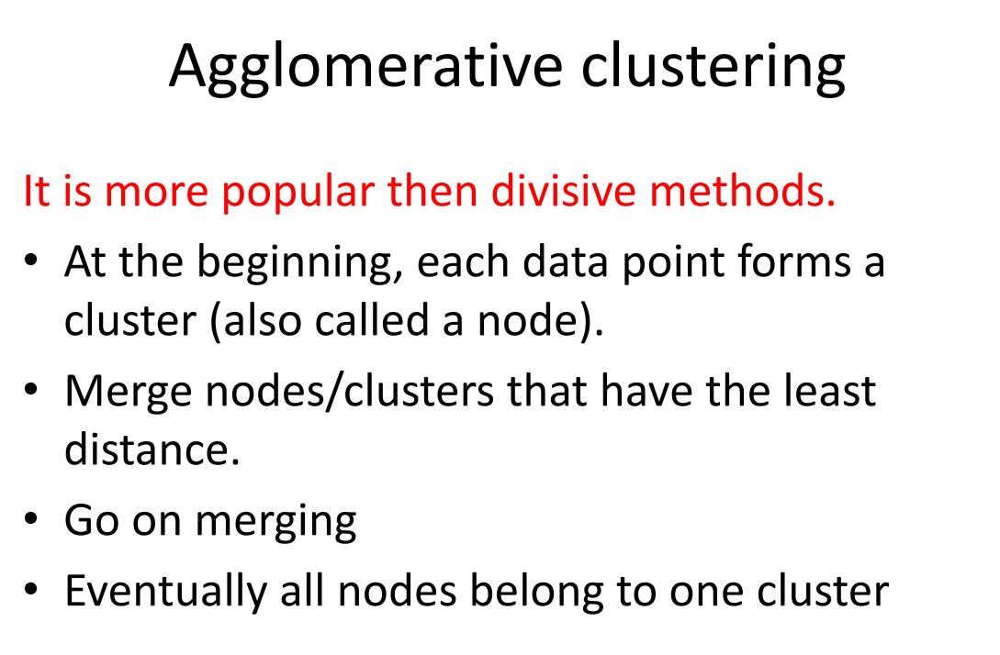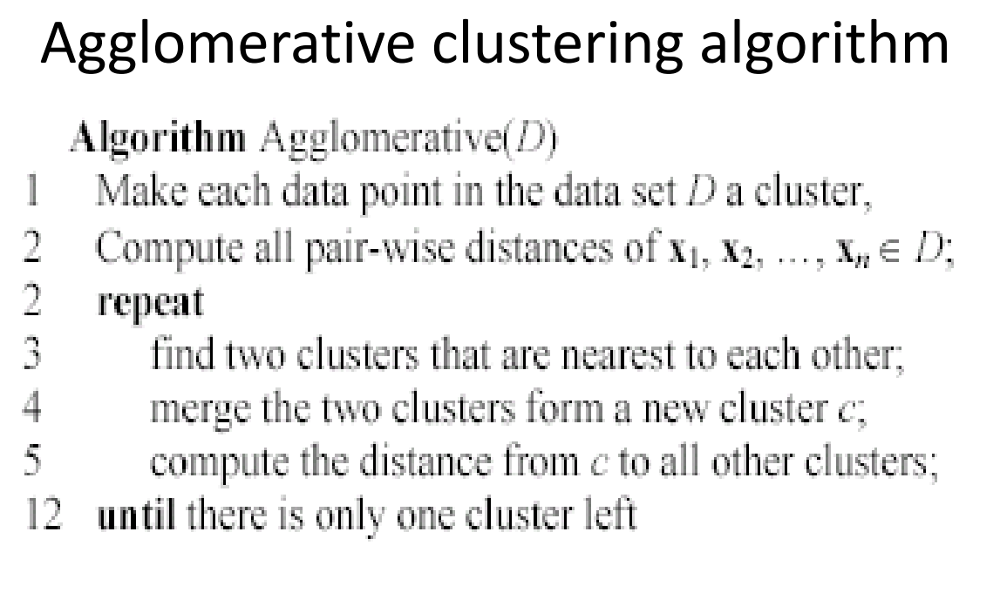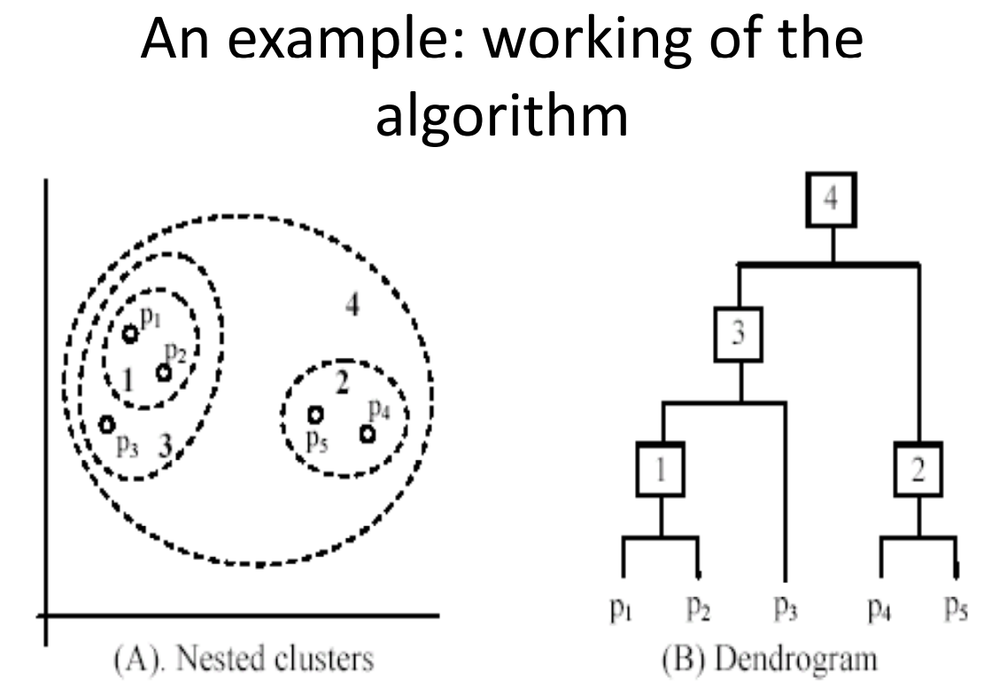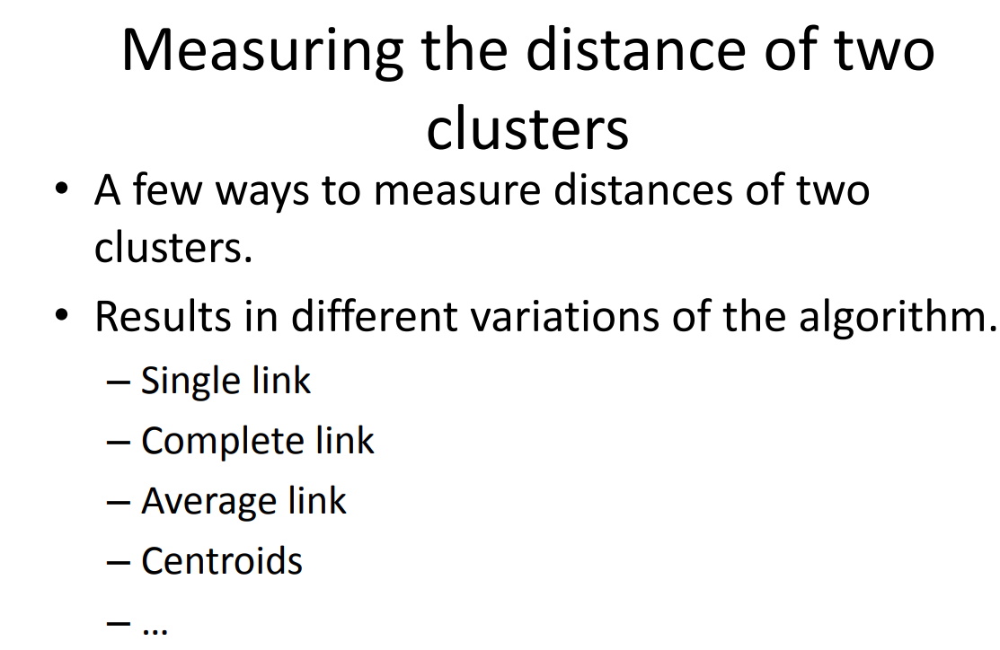

#Methods to find the distance between the 2 cluster




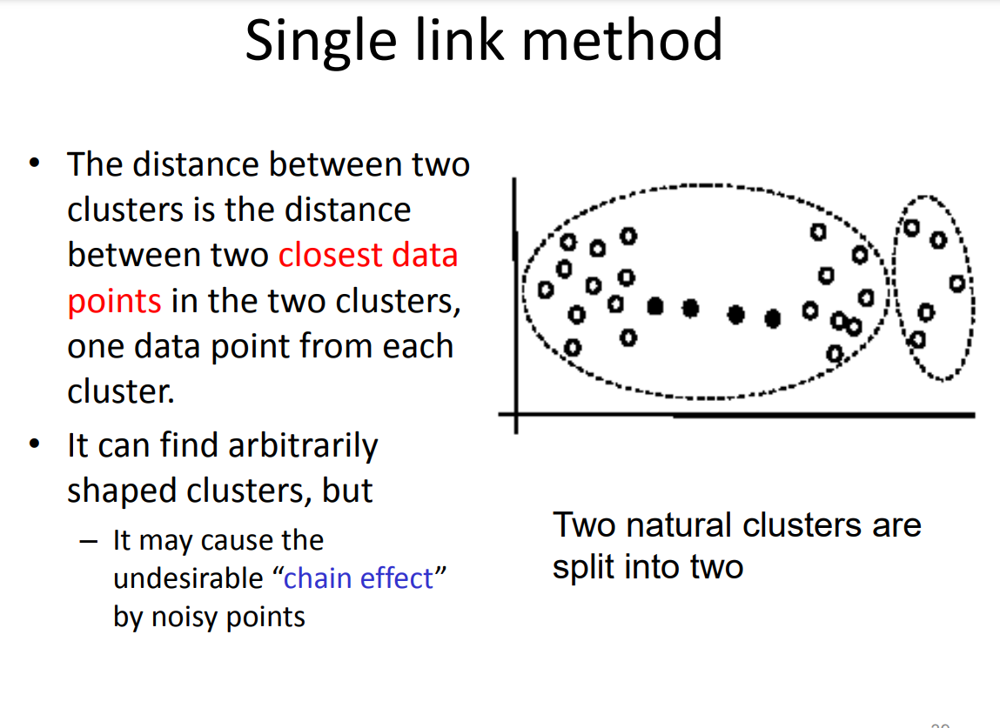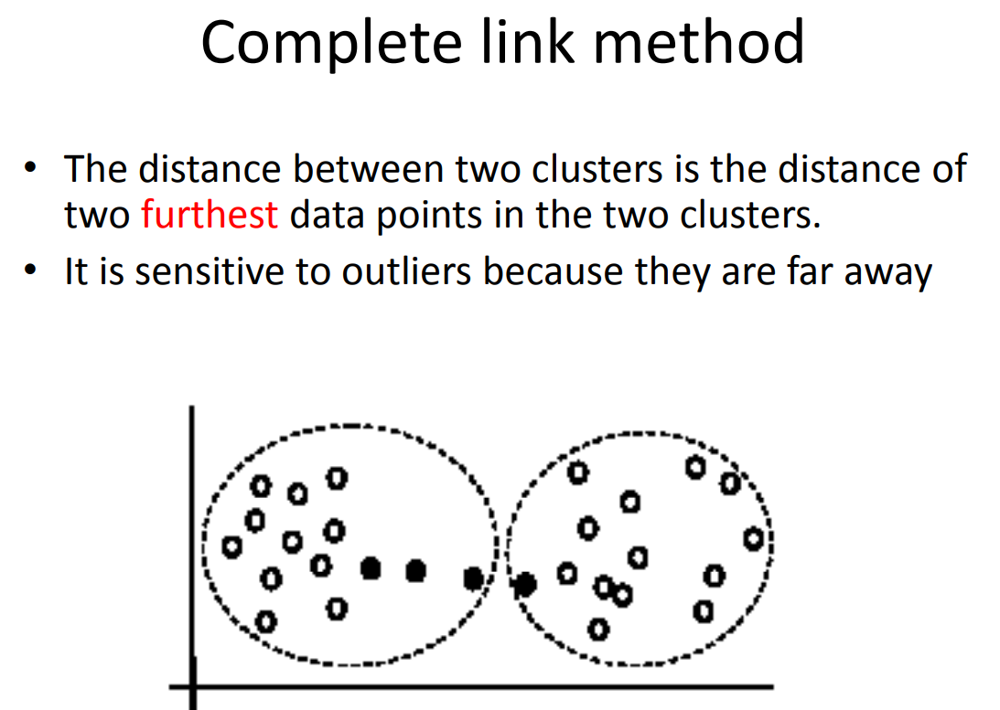

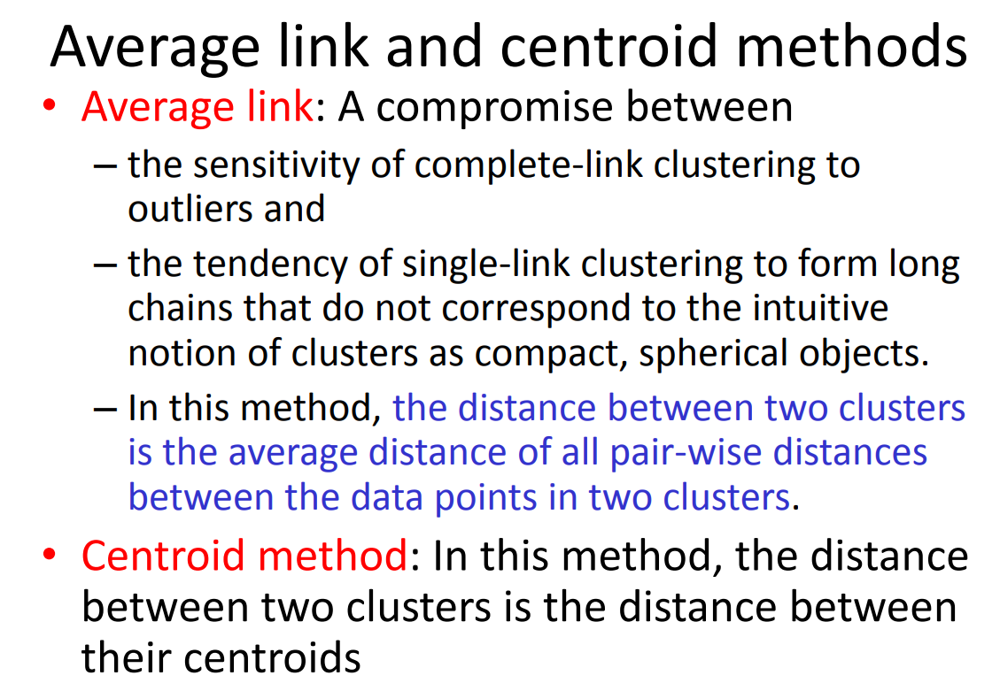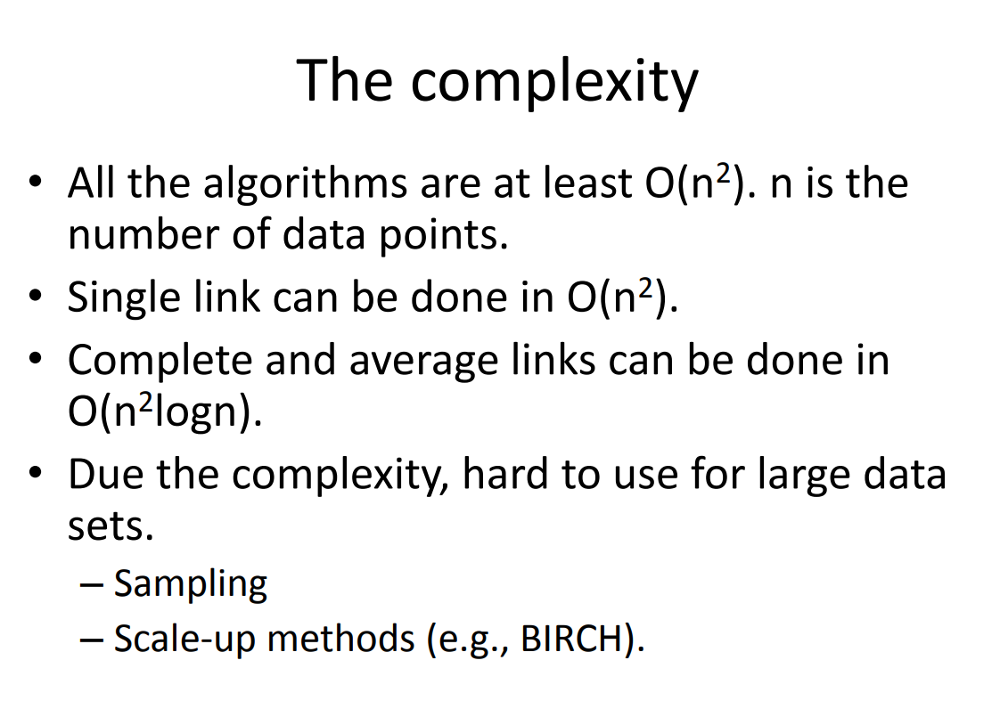

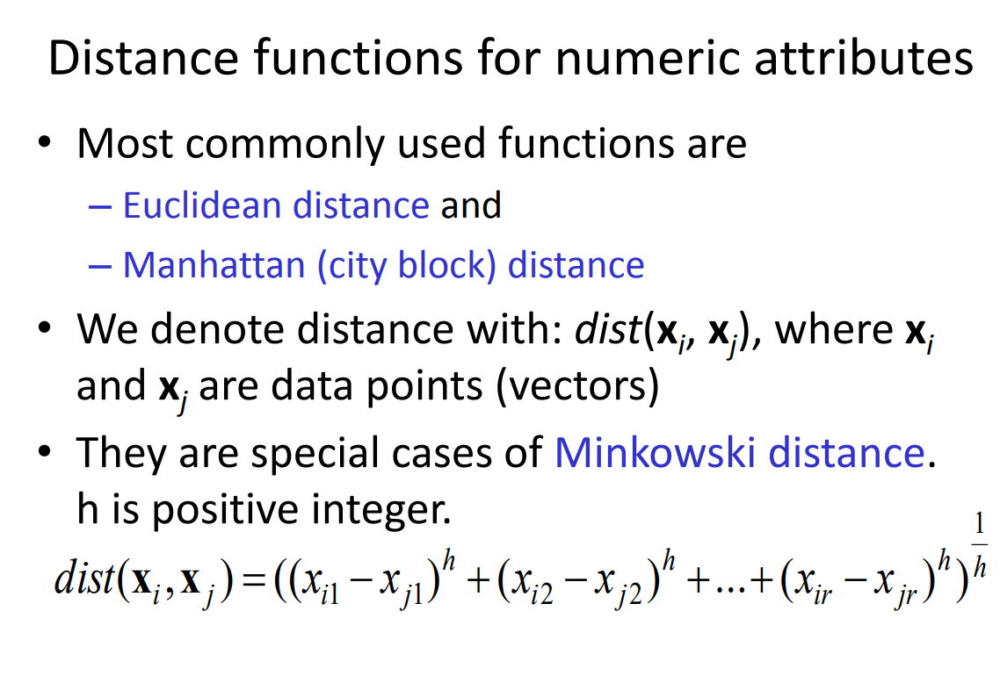
...

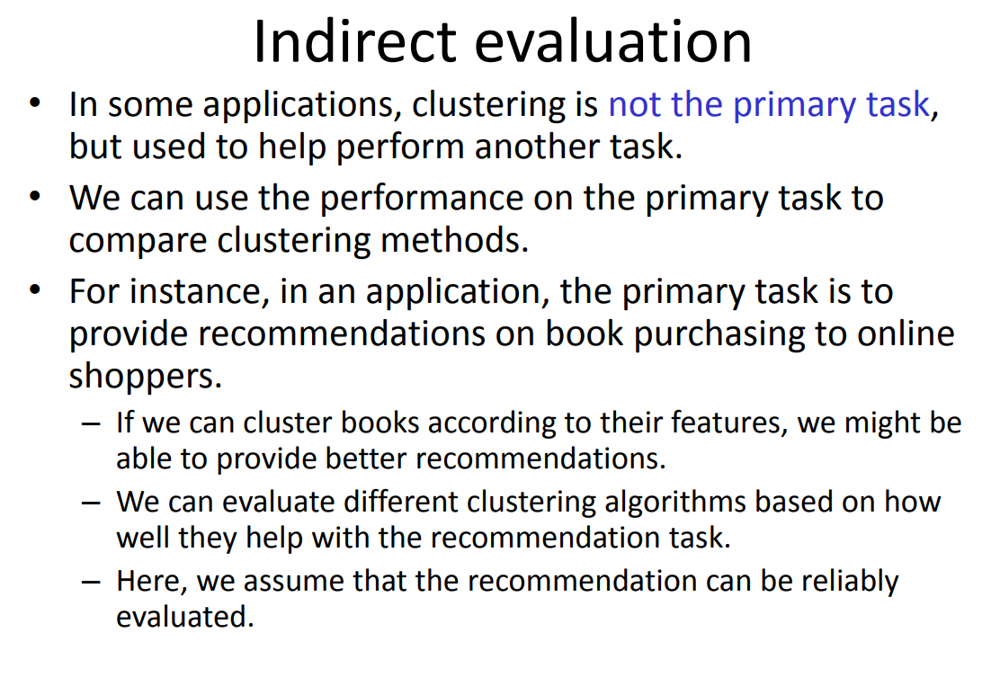

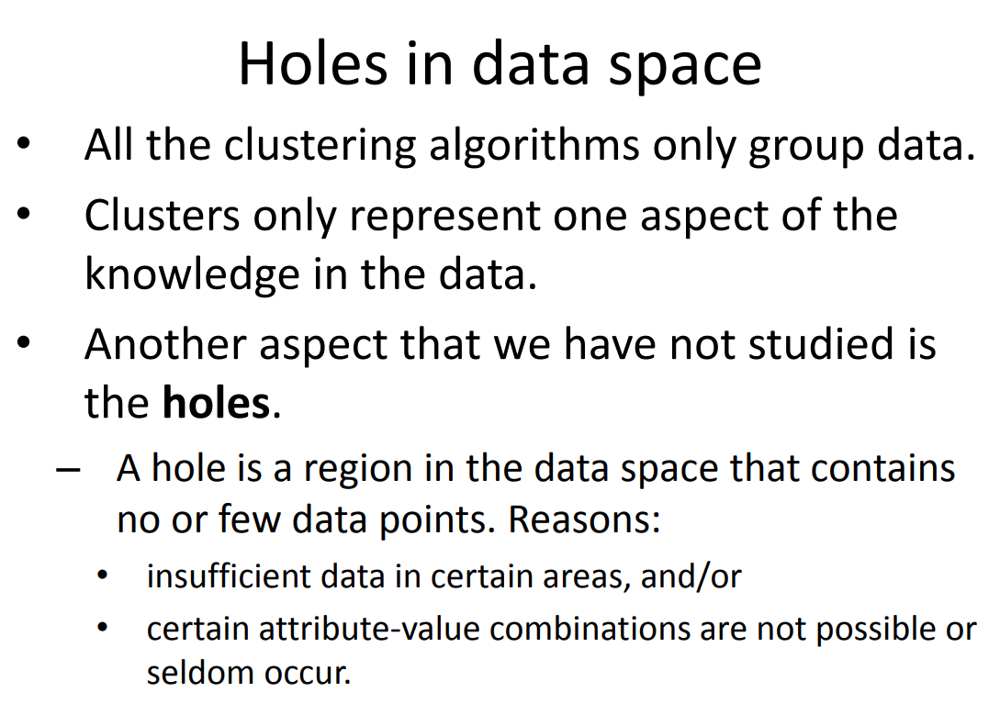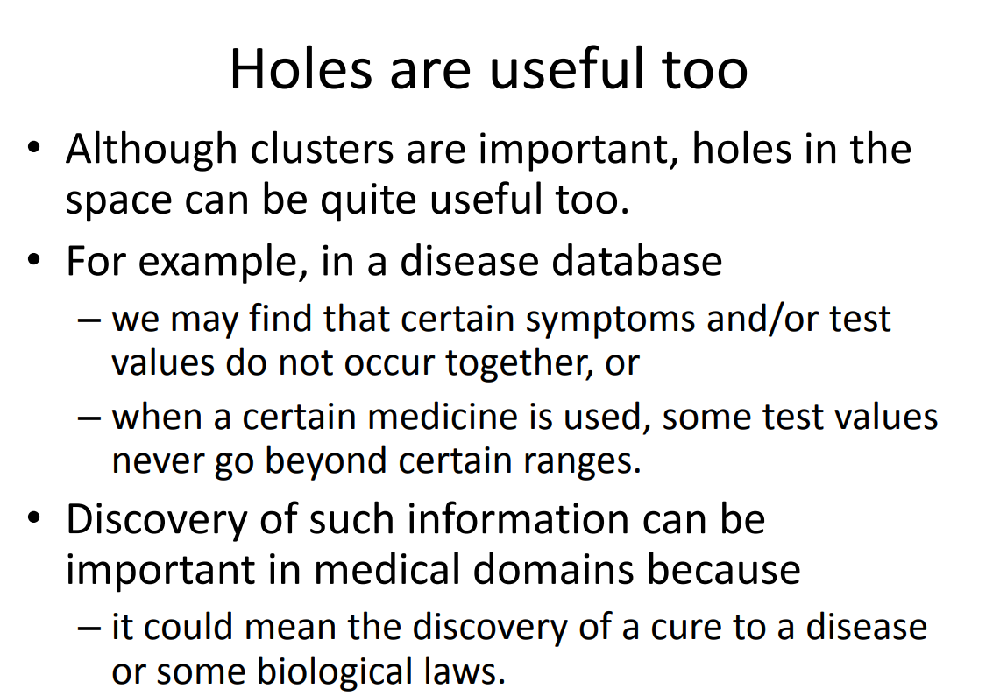

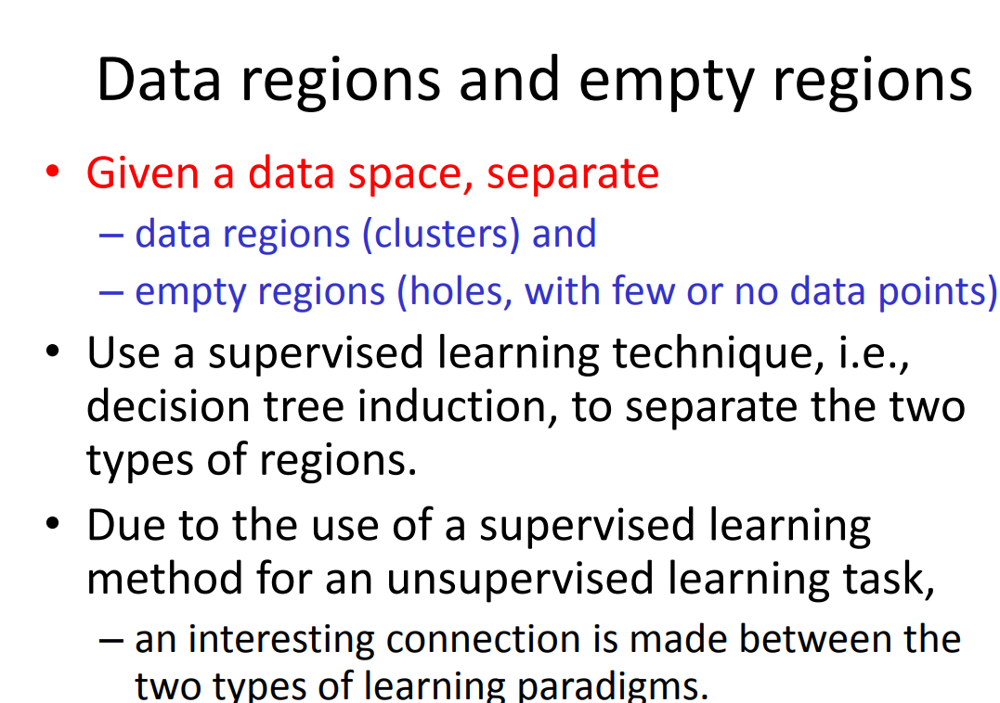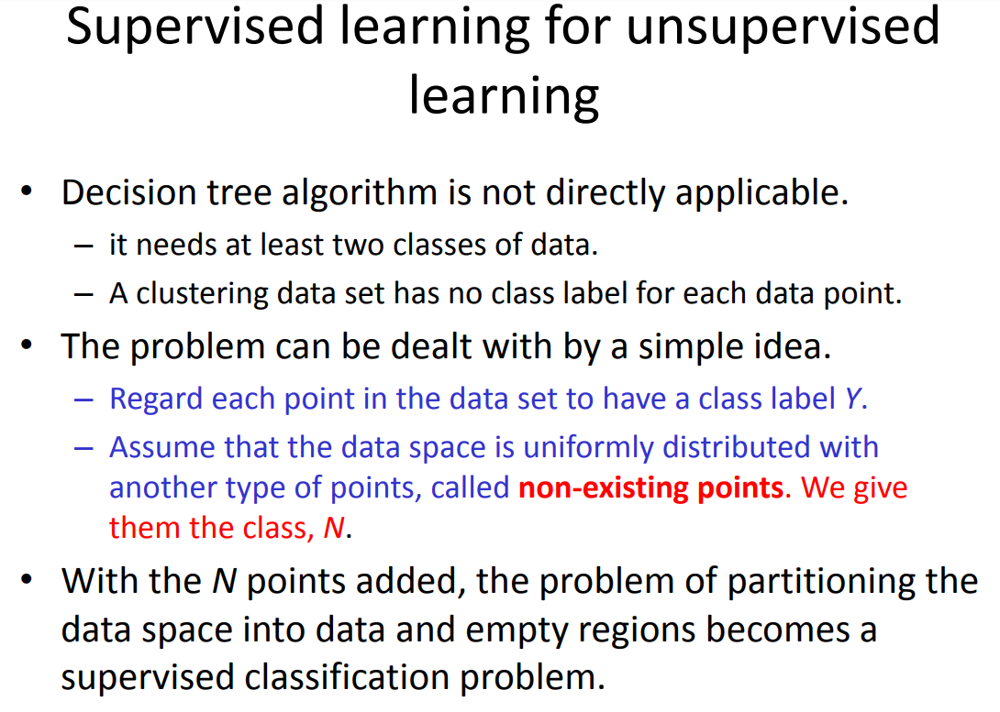

In [ ]:
#K Means is an algorithm that takes in a dataset and a constant
k and return k centroid (which define cluster of daa in the )

K means Without Sklearn

In [ ]:
import pandas as pd
data=pd.read_csv('/content/iris.csv')
data

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [ ]:
#Funstion K means
#K Means us and algo that takes in dataset and a constant
#k and returns k centroid (which define cluster of data in dataset whihc are similar to one another)

def kmeans(dataSet,k):
  #Initialize centroids randomly
 numFeatures = dataSet.getNumFeatures()
    centroids = getRandomCentroids(numFeatures, k)

    # Initialize book keeping vars.
    iterations = 0
    oldCentroids = None

    # Run the main k-means algorithm
    while not shouldStop(oldCentroids, centroids, iterations):
        # Save old centroids for convergence test. Book keeping.
        oldCentroids = centroids
        iterations += 1

        # Assign labels to each datapoint based on centroids
        labels = getLabels(dataSet, centroids)

        # Assign centroids based on datapoint labels
        centroids = getCentroids(dataSet, labels, k)

    # We can get the labels too by calling getLabels(dataSet, centroids)
    return centroids

IndentationError: unexpected indent (<ipython-input-3-a61fa655f589>, line 8)